In [11]:
import pandas
import seaborn

## 1. Importing data file

In [12]:
data = pandas.read_csv('./uber-raw-data-apr14.csv')

In [13]:
data.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


## 2. cleaning the data

In [14]:
data['Date/Time'] = data['Date/Time'].map(pandas.to_datetime)

In [15]:
data.head()

,Date/Time,Lat,Lon,Base
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512


In [16]:
data['Date/Time']

0        2014-04-01 00:11:00
1        2014-04-01 00:17:00
2        2014-04-01 00:21:00
3        2014-04-01 00:28:00
4        2014-04-01 00:33:00
5        2014-04-01 00:33:00
6        2014-04-01 00:39:00
7        2014-04-01 00:45:00
8        2014-04-01 00:55:00
9        2014-04-01 01:01:00
10       2014-04-01 01:19:00
11       2014-04-01 01:48:00
12       2014-04-01 01:49:00
13       2014-04-01 02:11:00
14       2014-04-01 02:25:00
15       2014-04-01 02:31:00
16       2014-04-01 02:43:00
17       2014-04-01 03:22:00
18       2014-04-01 03:35:00
19       2014-04-01 03:35:00
20       2014-04-01 03:41:00
21       2014-04-01 04:11:00
22       2014-04-01 04:15:00
23       2014-04-01 04:19:00
24       2014-04-01 04:20:00
25       2014-04-01 04:26:00
26       2014-04-01 04:27:00
27       2014-04-01 04:38:00
28       2014-04-01 04:47:00
29       2014-04-01 04:49:00
                 ...        
564486   2014-04-30 22:25:00
564487   2014-04-30 22:25:00
564488   2014-04-30 22:25:00
564489   2014-

In [17]:
def get_dom(dt):
    return dt.day

data['dom'] = data['Date/Time'].map(get_dom)

In [19]:
def get_weekday(dt):
    return dt.weekday()

data['weekday'] = data['Date/Time'].map(get_weekday)

In [20]:
def get_hour(dt):
    return dt.hour

data['hour'] = data['Date/Time'].map(get_hour)

In [21]:
data.head()

,Date/Time,Lat,Lon,Base,dom,weekday,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,1,1,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,1,1,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,1,1,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,1,1,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,1,1,0


In [22]:
data.tail()

,Date/Time,Lat,Lon,Base,dom,weekday,hour
564511,2014-04-30 23:22:00,40.7640,-73.9744,B02764,30,2,23
564512,2014-04-30 23:26:00,40.7629,-73.9672,B02764,30,2,23
564513,2014-04-30 23:31:00,40.7443,-73.9889,B02764,30,2,23
564514,2014-04-30 23:32:00,40.6756,-73.9405,B02764,30,2,23
564515,2014-04-30 23:48:00,40.6880,-73.9608,B02764,30,2,23


## 3. data analysis

Populating the interactive namespace from numpy and matplotlib


Text(0.5, 1.0, 'Frequency by DoM - uber - Apr 2014')

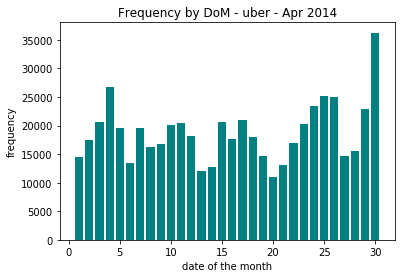

In [49]:
%pylab inline
hist(data.dom, bins=30, rwidth=.8, color="teal", range=(0.5, 30.5))
xlabel('date of the month')
ylabel('frequency')
title('Frequency by DoM - uber - Apr 2014')

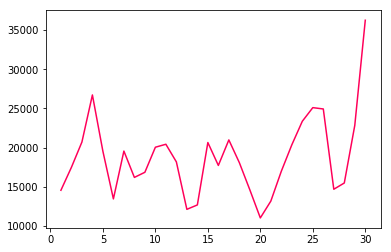

In [62]:
#for k, rows in data.groupby('dom'):
#    print((k, len(rows)))

def count_rows(rows):
    return len(rows)

by_date = data.groupby('dom').apply(count_rows)
plot(by_date, color='#FF0059')

''

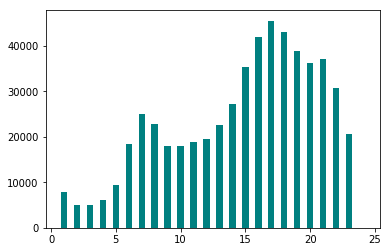

In [67]:
hist(data.hour, rwidth=0.5, bins=24, color='teal', range=(0.5, 24.5))
;

''

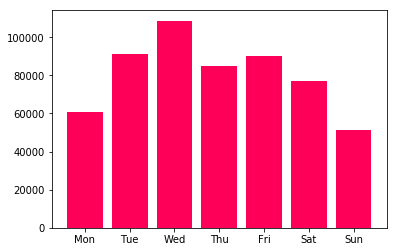

In [68]:
hist(data.weekday, bins=7, range =(-0.5,6.5), rwidth=.8, color='#FF0059')
xticks(range(7), 'Mon Tue Wed Thu Fri Sat Sun'.split())
;

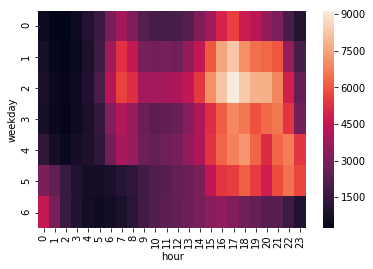

In [65]:
by_cross = data.groupby('weekday hour'.split()).apply(count_rows).unstack()
seaborn.heatmap(by_cross)

''

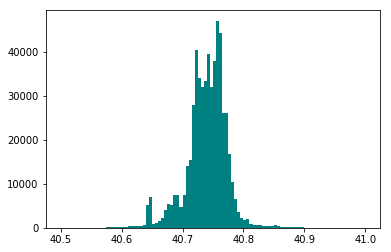

In [71]:
hist(data['Lat'], bins=100,color = 'teal', range = (40.5, 41))
;

''

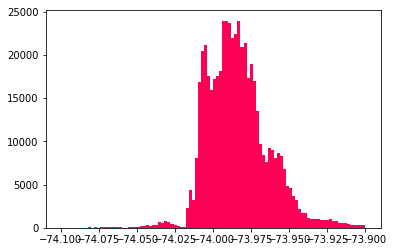

In [73]:
hist(data['Lon'], bins=100,color = '#FF0059', range = (-74.1, -73.9))
;

''

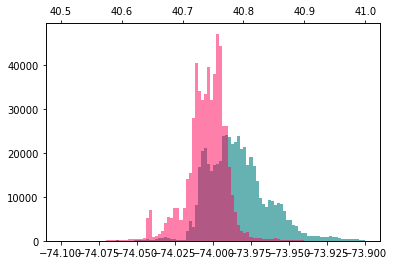

In [87]:
hist(data['Lon'], bins=100, range = (-74.1, -73.9), color='teal', alpha=.6)
twiny()
hist(data['Lat'], bins=100, range = (40.5, 41), color='#FF0059', alpha=.5)
;

## 4. Working on Longitude and Lattitude

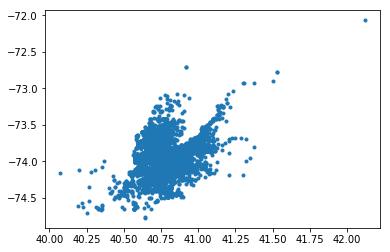

In [111]:
plot(data['Lat'],data['Lon'], '.')

(40.7, 41)

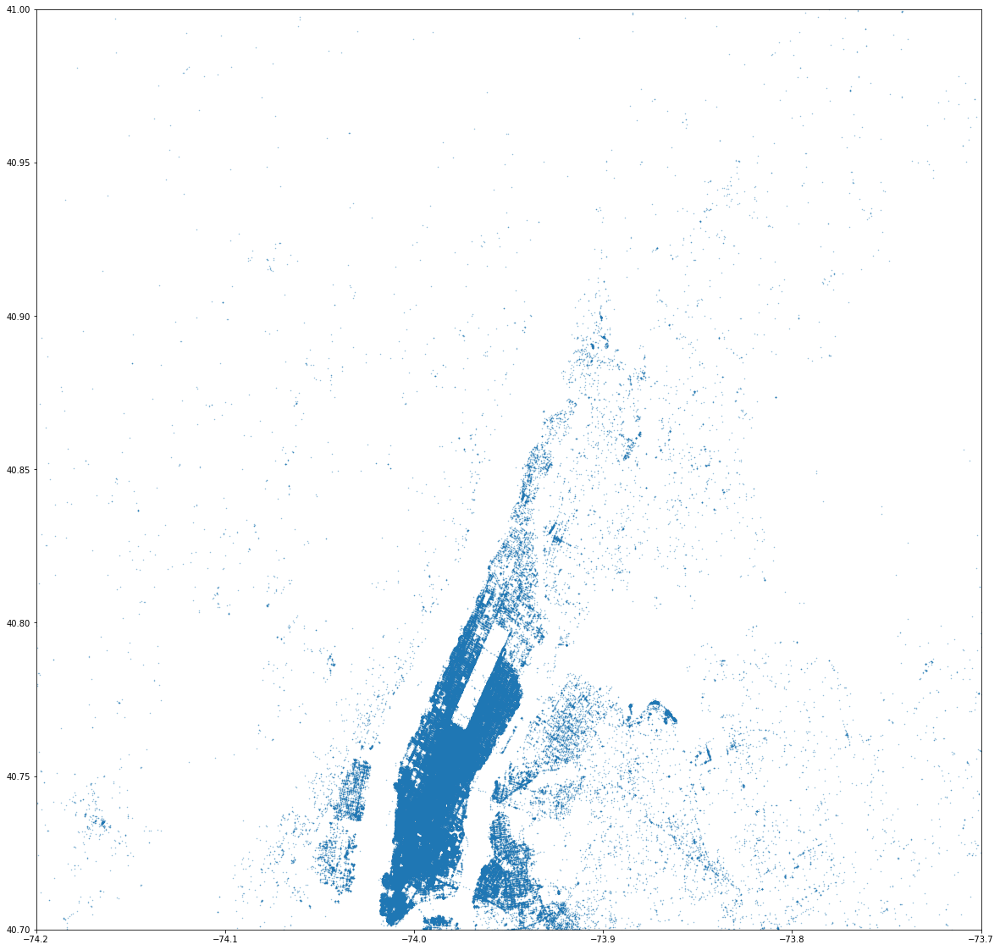

In [112]:
figure(figsize=(20, 20))
plot(data['Lon'], data['Lat'], '.', ms=1, alpha=.5)
xlim(-74.2, -73.7)
ylim(40.7, 41)

## 5. And that's Manhattan

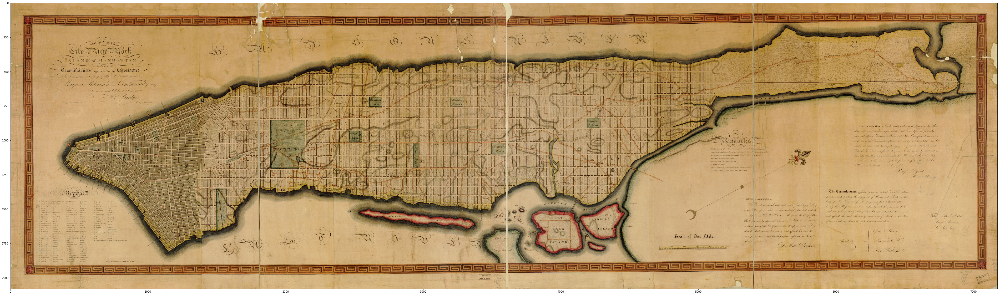

In [114]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
figure(figsize=(200, 20))
img=mpimg.imread('./default.jpg')
imgplot = plt.imshow(img)
plt.show()